In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 2D Convolution

In [ ]:
img = np.array([[6,3,7,9,1],[7,0,3,1,3],[8,1,5,3,6],[3,9,4,3,5],[7,8,2,3,0]], dtype = np.uint8)

In [ ]:
img

array([[6, 3, 7, 9, 1],
       [7, 0, 3, 1, 3],
       [8, 1, 5, 3, 6],
       [3, 9, 4, 3, 5],
       [7, 8, 2, 3, 0]], dtype=uint8)

In [ ]:
kernel = np.array([[1,3,1],[2,-1,2],[3,-2,-1]], dtype = np.float32)
kernel

array([[ 1.,  3.,  1.],
       [ 2., -1.,  2.],
       [ 3., -2., -1.]], dtype=float32)

In [ ]:
kernel_flipX = cv2.flip(kernel,0)
kernel_flipX

array([[ 3., -2., -1.],
       [ 2., -1.,  2.],
       [ 1.,  3.,  1.]], dtype=float32)

In [ ]:
kernel_flipY = cv2.flip(kernel,1)
kernel_flipY

array([[ 1.,  3.,  1.],
       [ 2., -1.,  2.],
       [-1., -2.,  3.]], dtype=float32)

## Flipped Kernel for Convolution

In [ ]:
kernel_flip = cv2.flip(kernel,-1)
kernel_flip

array([[-1., -2.,  3.],
       [ 2., -1.,  2.],
       [ 1.,  3.,  1.]], dtype=float32)

In [ ]:
conv = cv2.filter2D(img, -1, kernel_flip, borderType = cv2.BORDER_CONSTANT) # borderType = cv2.BORDER_CONSTANT uses zeros
                                                                            # at the border i.e zero padding.

In [ ]:
conv

array([[21, 33, 27, 16, 27],
       [15, 45, 28,  9,  9],
       [ 0, 61, 24, 41, 11],
       [31, 43, 35, 33,  0],
       [30,  1, 12,  6,  0]], dtype=uint8)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Signal and Image Processing With Python/Section19_Spatial Domain Filtering

/content/drive/MyDrive/Signal and Image Processing With Python/Section19_Spatial Domain Filtering


# Applications of 2D Convolution

In [ ]:
img1 = cv2.imread('lena.tif', 0)

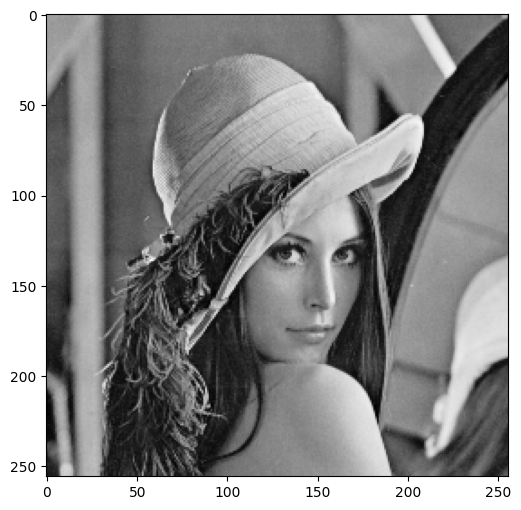

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(img1, cmap = 'gray')
plt.show()

# Image Blurring by 2D Convolution

In [ ]:
# Creating 3 x 3 kernel
kernel = np.ones( shape = (3, 3), dtype = np.float32) / 15

In [ ]:
kernel

array([[0.06666667, 0.06666667, 0.06666667],
       [0.06666667, 0.06666667, 0.06666667],
       [0.06666667, 0.06666667, 0.06666667]], dtype=float32)

In [ ]:
# We use the cv2.fitler2D to conovlve the kernal with an image 
conv_img = cv2.filter2D(img1, -1,  kernel, borderType = cv2.BORDER_CONSTANT)

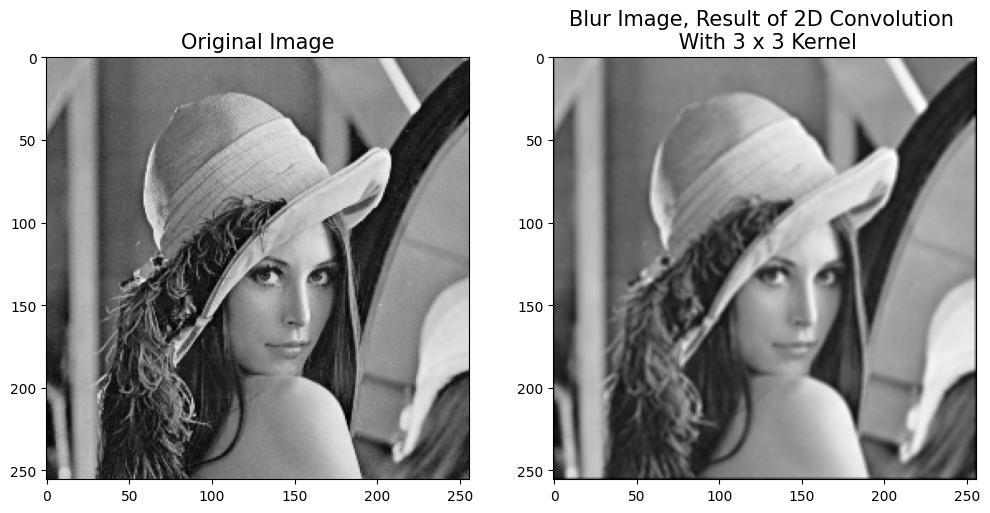

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(conv_img, cmap = 'gray')
plt.title("Blur Image, Result of 2D Convolution \n With 3 x 3 Kernel", fontsize = 15)
plt.show()

In [ ]:
# Creating 5 x 5 kernel
kernel2 = np.ones( shape = (5, 5), dtype = np.float32) / 15

In [ ]:
conv_img_5x5 = cv2.filter2D(img1, -1,  kernel2) 

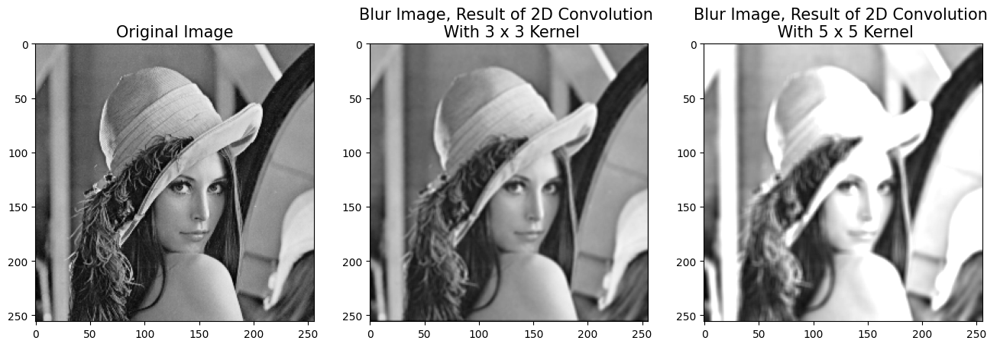

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(conv_img, cmap = 'gray')
plt.title("Blur Image, Result of 2D Convolution \n With 3 x 3 Kernel", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(conv_img_5x5, cmap = 'gray')
plt.title("Blur Image, Result of 2D Convolution \n With 5 x 5 Kernel", fontsize = 15)
plt.show()

# Image Sharpening by 2D Convolution

In [ ]:
kernel_sharp = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype = np.float32)

In [ ]:
kernel_sharp

array([[ 0., -1.,  0.],
       [-1.,  5., -1.],
       [ 0., -1.,  0.]], dtype=float32)

In [ ]:
sharp_img = cv2.filter2D(img1, -1,  kernel_sharp)

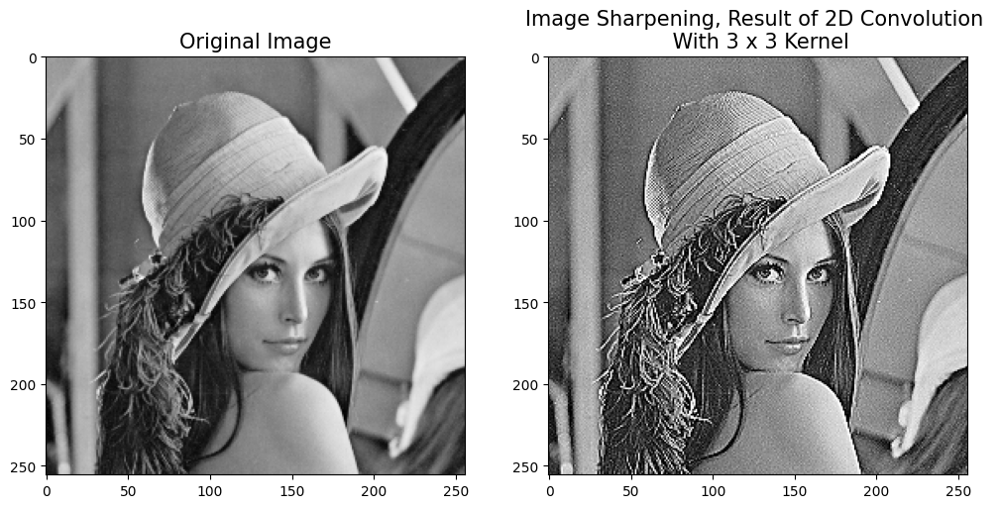

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(sharp_img, cmap = 'gray')
plt.title("Image Sharpening, Result of 2D Convolution \n With 3 x 3 Kernel", fontsize = 15)
plt.show()

In [ ]:
blur_img = conv_img

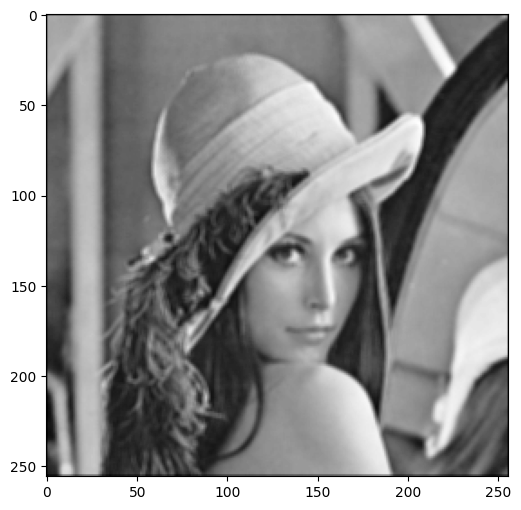

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(blur_img, cmap = 'gray')
plt.show()

In [ ]:
sharp_img_2 = cv2.filter2D(blur_img, -1,  kernel_sharp)

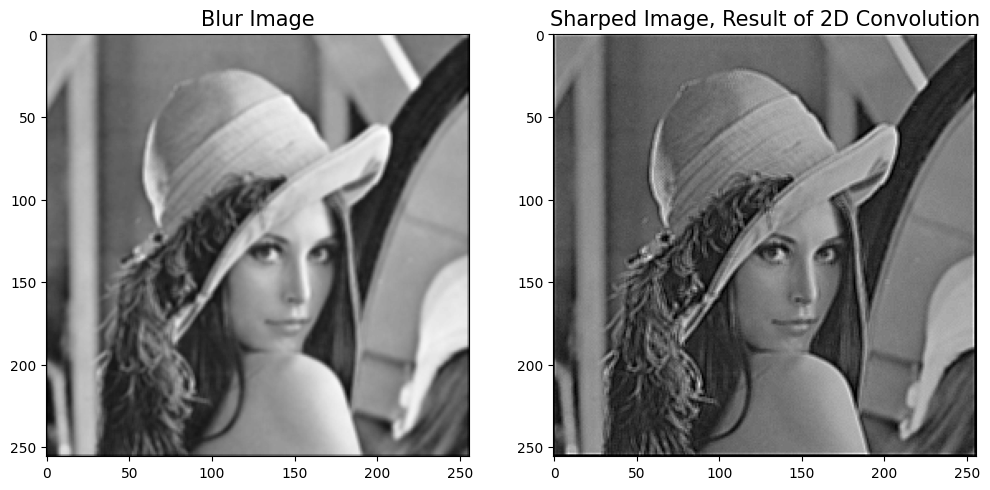

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(blur_img, cmap = 'gray')
plt.title("Blur Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(sharp_img_2, cmap = 'gray')
plt.title("Sharped Image, Result of 2D Convolution", fontsize = 15)
plt.show()

# Edge Detection By 2D Convolution

In [ ]:
kernel_edge = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype = np.float32)

In [ ]:
kernel_edge

array([[ 1.,  1.,  1.],
       [ 0.,  0.,  0.],
       [-1., -1., -1.]], dtype=float32)

In [ ]:
img_edge = cv2.filter2D(img1, -1,  kernel_edge)

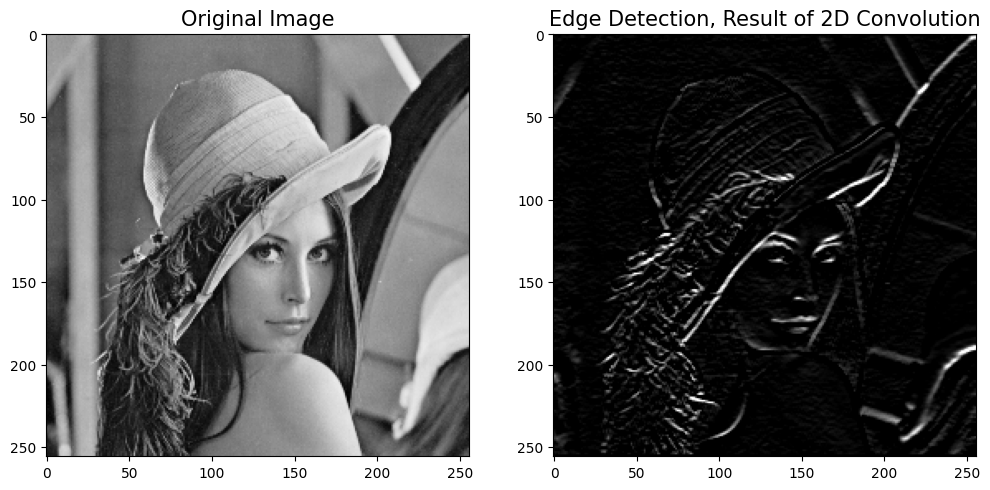

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(img_edge, cmap = 'gray')
plt.title("Edge Detection, Result of 2D Convolution", fontsize = 15)
plt.show()

# Mean Filtering ( Low Pass Filter)

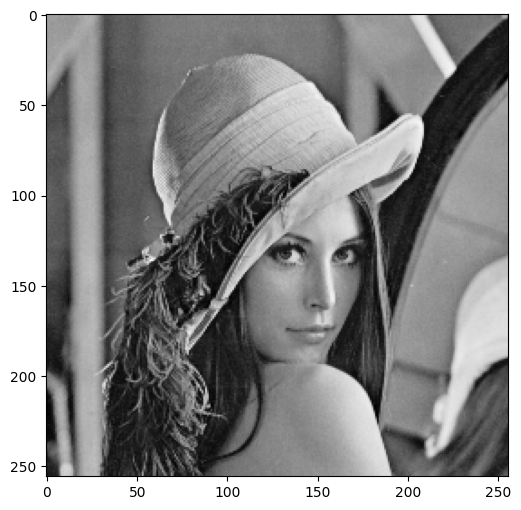

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(img1, cmap = 'gray')
plt.show()

In [ ]:
img_mean = cv2.blur(img1, ksize = (3,3))

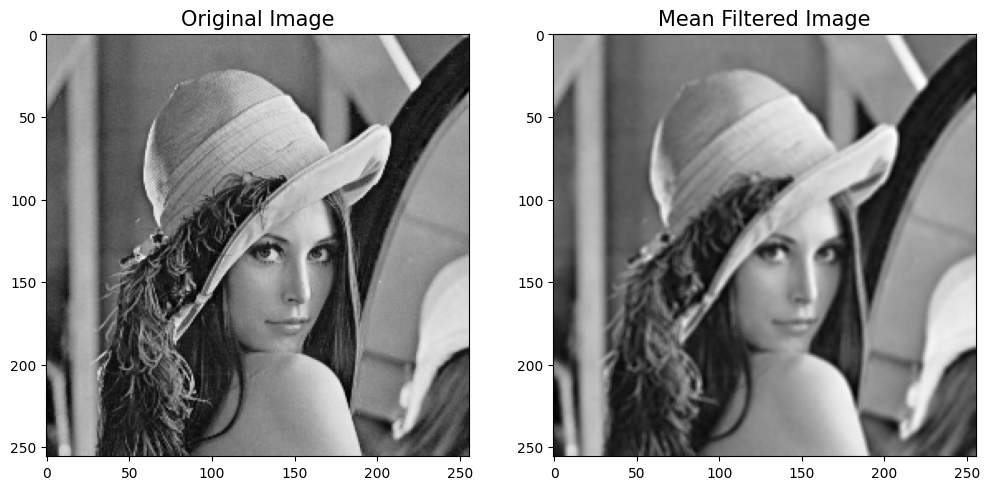

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(img_mean, cmap = 'gray')
plt.title("Mean Filtered Image", fontsize = 15)
plt.show()

# Image Denoising Using Mean Filtering

In [ ]:
matrix = np.zeros(img1.shape, np.uint8)

In [ ]:
matrix.shape

(256, 256)

In [ ]:
noise = cv2.randn(matrix, mean = 0, stddev = 15)

In [ ]:
noise

array([[ 0,  9,  0, ...,  1,  0, 11],
       [ 0,  0, 31, ...,  8,  4,  0],
       [ 0,  6,  2, ..., 11, 11, 11],
       ...,
       [ 5, 28,  0, ..., 16,  5,  0],
       [22,  1,  0, ...,  0,  0, 13],
       [ 9,  0,  0, ..., 20,  8,  2]], dtype=uint8)

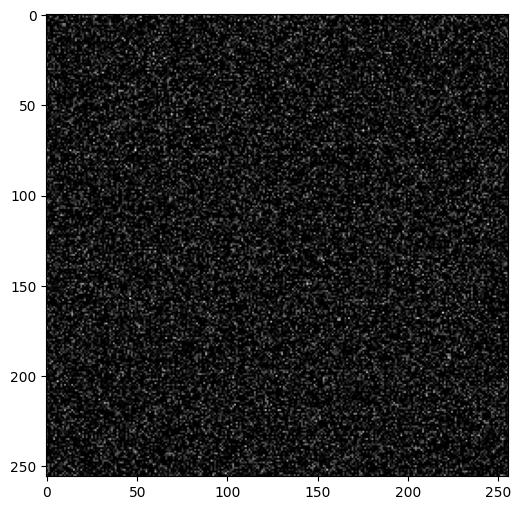

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(noise, cmap = 'gray')
plt.show()

In [ ]:
Noisy_img = cv2.add(img1, noise)

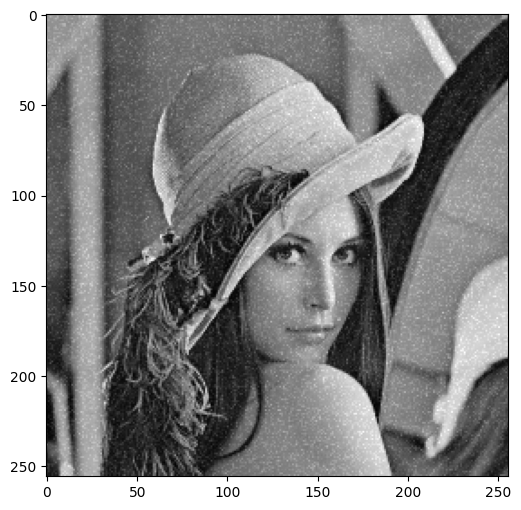

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(Noisy_img, cmap = 'gray')
plt.show()

In [ ]:
meanfiltered_Image = cv2.blur(Noisy_img, ksize = (5,5))

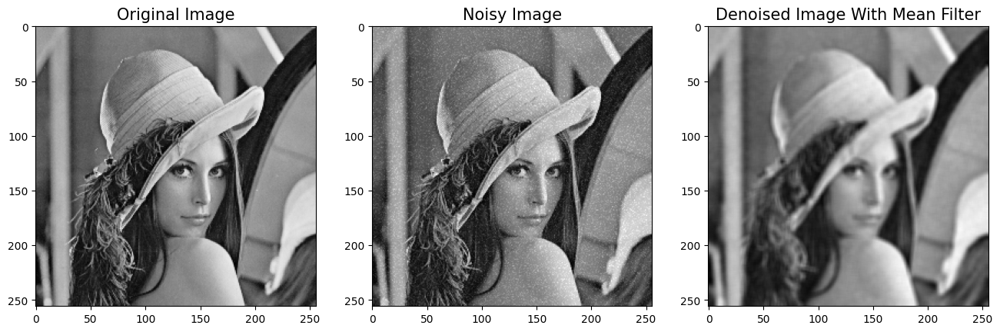

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(img1, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(Noisy_img, cmap = 'gray')
plt.title("Noisy Image", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(meanfiltered_Image, cmap = 'gray')
plt.title("Denoised Image With Mean Filter", fontsize = 15)
plt.show()

# Image Denoising Using Gaussian Filtering

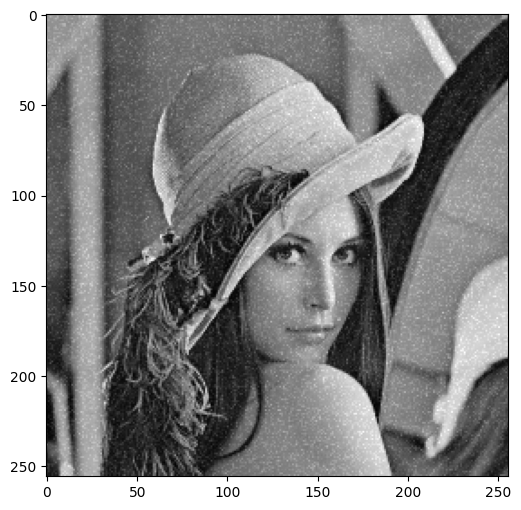

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(Noisy_img, cmap = 'gray')
plt.show()

In [ ]:
GaussFilter_image = cv2.GaussianBlur(Noisy_img, (5,5), 15)  # 15 is the sigma value of Gaussian Filter 

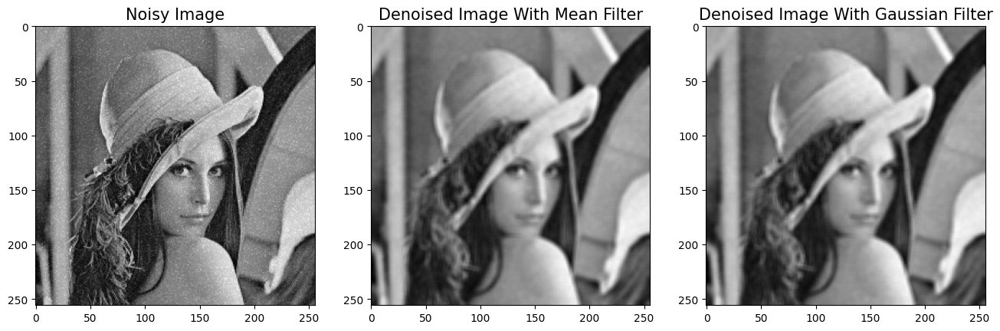

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(Noisy_img, cmap = 'gray')
plt.title("Noisy Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(meanfiltered_Image, cmap = 'gray')
plt.title("Denoised Image With Mean Filter", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Denoised Image With Gaussian Filter", fontsize = 15)
plt.show()

# Median Filtering 

In [ ]:
from skimage.util import random_noise
 

# Add salt-and-pepper noise to the image.
SP_NoisyImage = random_noise(img1, mode='s&p',amount = 0.05)
 
# The above function returns a floating-point image
# on the range [0, 1], thus we changed it to 'uint8'
# and from [0,255]
SP_NoisyImage = np.array(255*SP_NoisyImage, dtype = 'uint8')

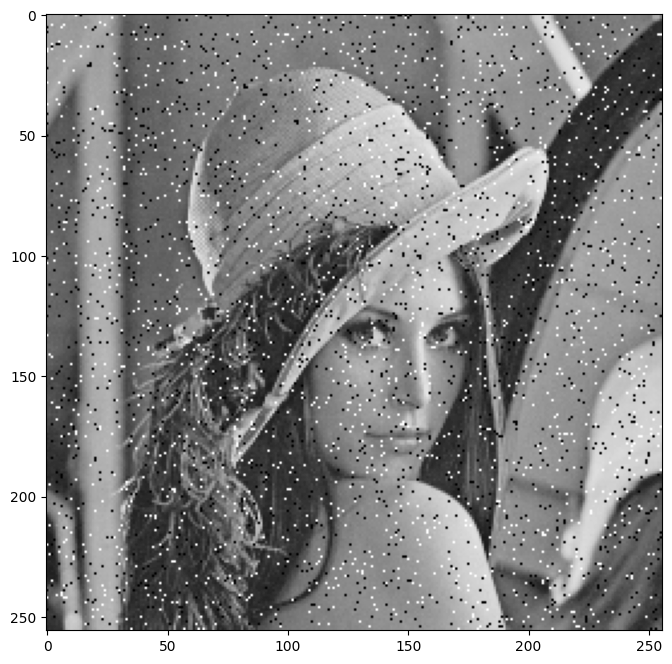

In [ ]:
plt.figure(figsize=(16,8))
plt.imshow(SP_NoisyImage, cmap = 'gray')
plt.show()

In [ ]:
medianFiltered_Image = cv2.medianBlur(SP_NoisyImage, 3) # 3 size of median kernel

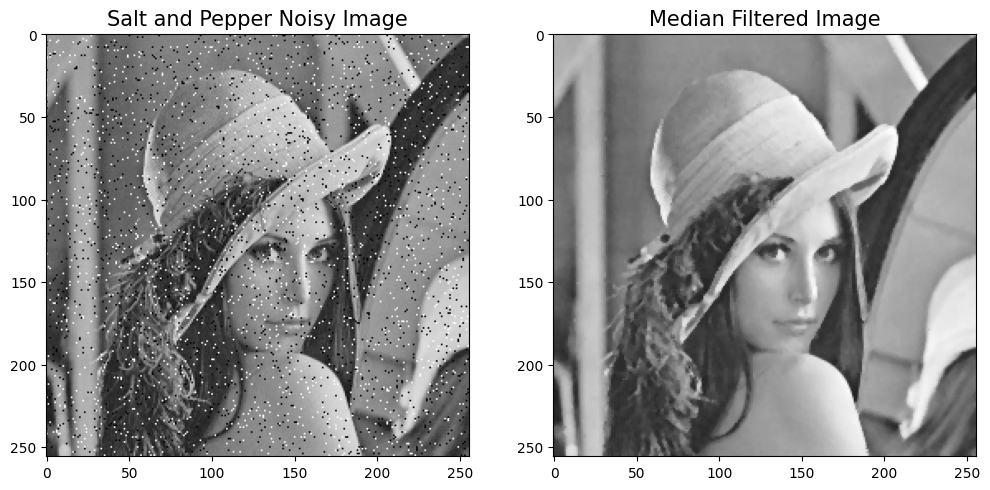

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(SP_NoisyImage, cmap = 'gray')
plt.title("Salt and Pepper Noisy Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(medianFiltered_Image, cmap = 'gray')
plt.title("Median Filtered Image", fontsize = 15)
plt.show()

In [ ]:
GaussFilter_image2 = cv2.GaussianBlur(SP_NoisyImage,(3,3), 15)  # 15 is the sigma value of Gaussian Filter 

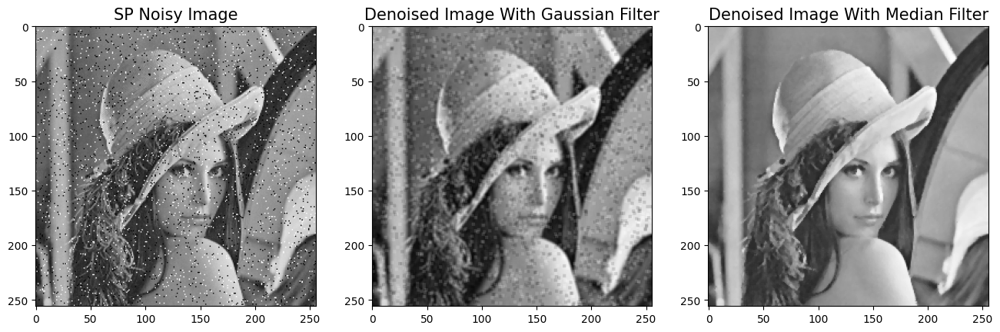

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(SP_NoisyImage, cmap = 'gray')
plt.title("SP Noisy Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(GaussFilter_image2, cmap = 'gray')
plt.title("Denoised Image With Gaussian Filter", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(medianFiltered_Image, cmap = 'gray')
plt.title("Denoised Image With Median Filter", fontsize = 15)
plt.show()

# Laplacian ( Image Sharpening, Edge Detection and High pass Filtering)

In [ ]:
GaussFilter_image = cv2.GaussianBlur(img1, (3,3), 15)  # 15 is the sigma value of Gaussian Filter 

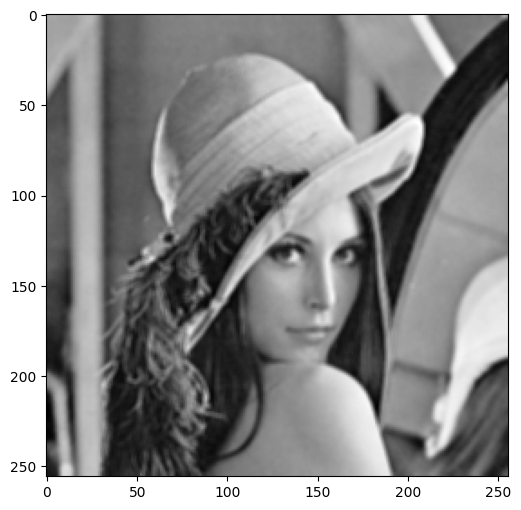

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.show()

In [ ]:
laplacian_Mask = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]], dtype = np.float32)

In [ ]:
laplacian_Mask

array([[ 0.,  1.,  0.],
       [ 1., -4.,  1.],
       [ 0.,  1.,  0.]], dtype=float32)

In [ ]:
Lap_Img = cv2.Laplacian(GaussFilter_image, -1,  laplacian_Mask)

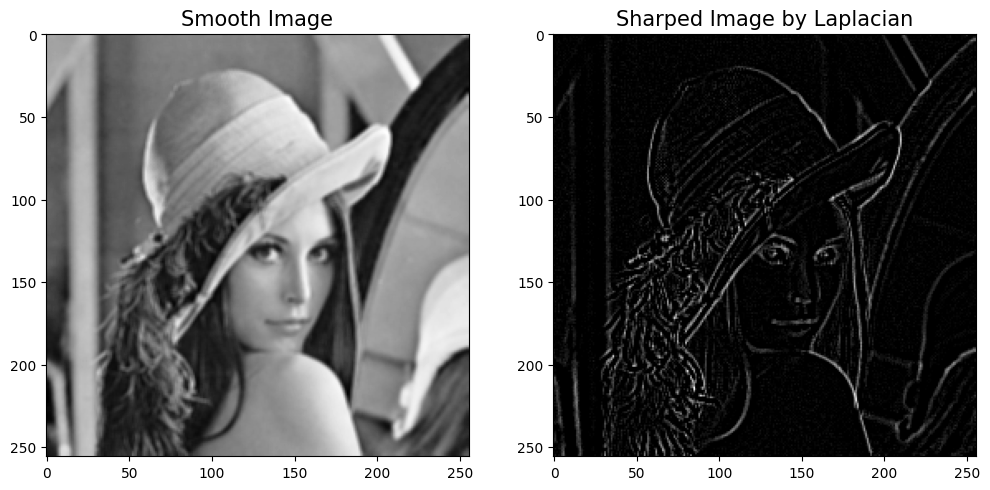

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(Lap_Img, cmap = 'gray')
plt.title("Sharped Image by Laplacian", fontsize = 15)
plt.show()

In [ ]:
laplacian_Mask2 = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]], dtype = np.float32)

In [ ]:
laplacian_Mask2

array([[ 0., -1.,  0.],
       [-1.,  4., -1.],
       [ 0., -1.,  0.]], dtype=float32)

In [ ]:
Lap_Img2= cv2.Laplacian(GaussFilter_image, -1,  laplacian_Mask2)

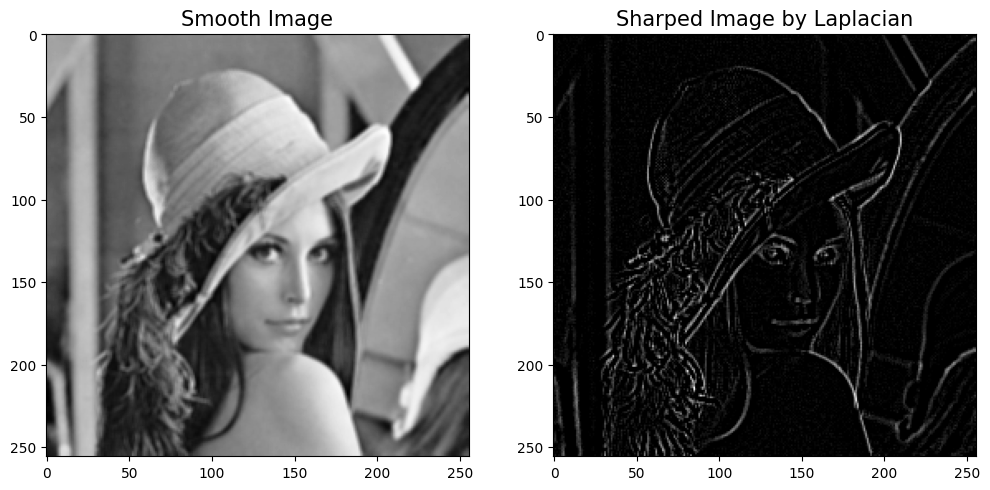

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(Lap_Img2, cmap = 'gray')
plt.title("Sharped Image by Laplacian", fontsize = 15)
plt.show()

In [ ]:
Lap_Img3 = cv2.Laplacian(GaussFilter_image, -1, ksize = 5)

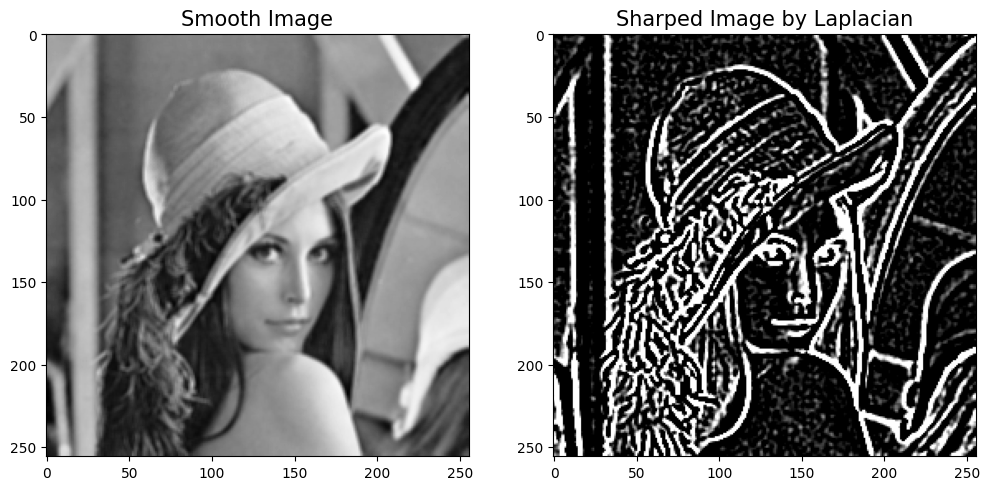

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(Lap_Img3, cmap = 'gray')
plt.title("Sharped Image by Laplacian", fontsize = 15)
plt.show()

In [ ]:
board = cv2.imread("board.png", 0)

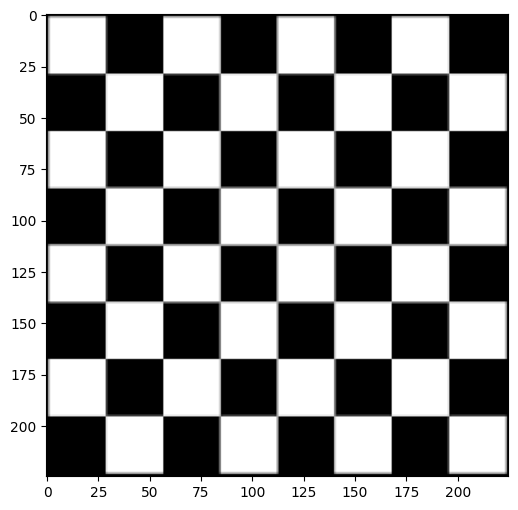

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(board, cmap = 'gray')
plt.show()

In [ ]:
GaussFilter_board = cv2.GaussianBlur(board,(3,3), 15)  # 15 is the sigma value of Gaussian Filter 

In [ ]:
laplacian_Mask

array([[ 0.,  1.,  0.],
       [ 1., -4.,  1.],
       [ 0.,  1.,  0.]], dtype=float32)

In [ ]:
Lap_board = cv2.Laplacian(GaussFilter_board, -1,  laplacian_Mask)

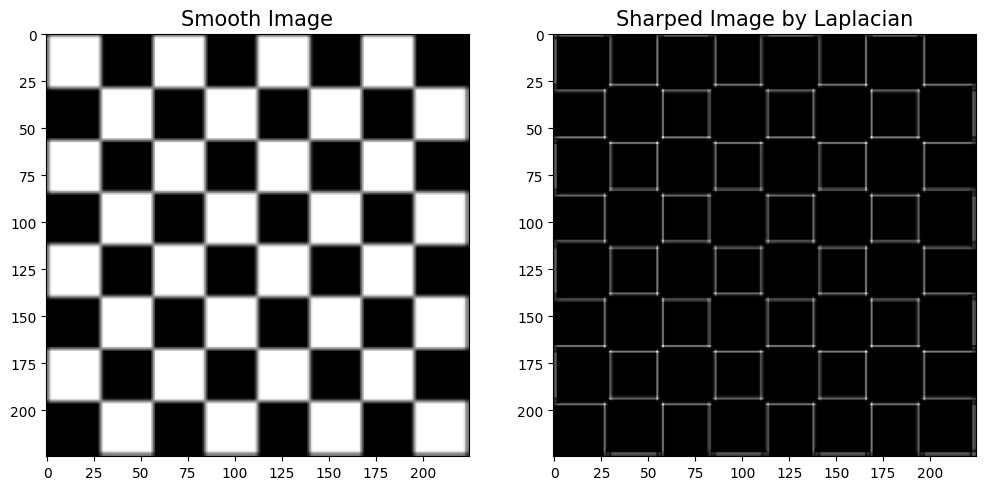

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_board, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(Lap_board, cmap = 'gray')
plt.title("Sharped Image by Laplacian", fontsize = 15)
plt.show()

In [ ]:
Lap_board2 = cv2.Laplacian(GaussFilter_board, -1, ksize = 5)

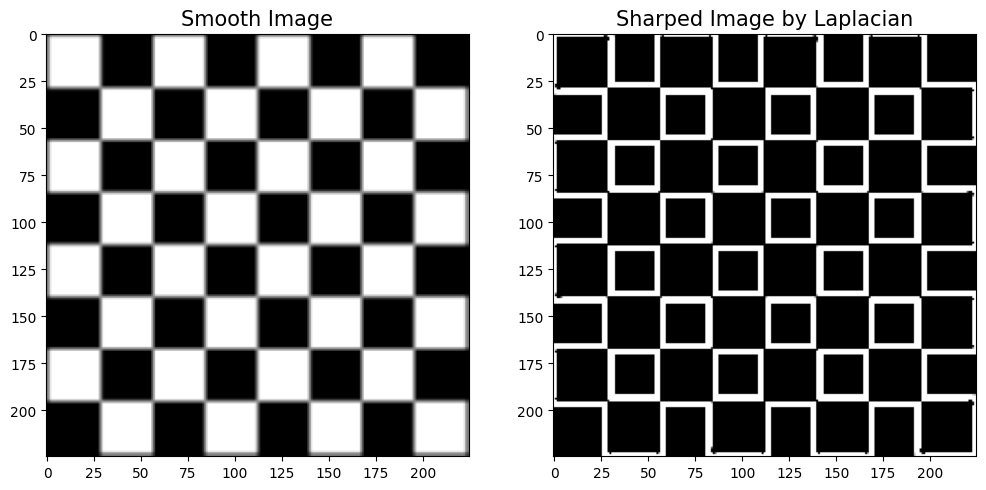

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_board, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(Lap_board2, cmap = 'gray')
plt.title("Sharped Image by Laplacian", fontsize = 15)
plt.show()

# High Boost Filtering

In [ ]:
HighBoostFilter = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]], dtype = np.float32)

In [ ]:
HighBoostFilter

array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]], dtype=float32)

In [ ]:
boostedImage = cv2.filter2D(GaussFilter_board, -1, HighBoostFilter) # -1 for flipping Kernel

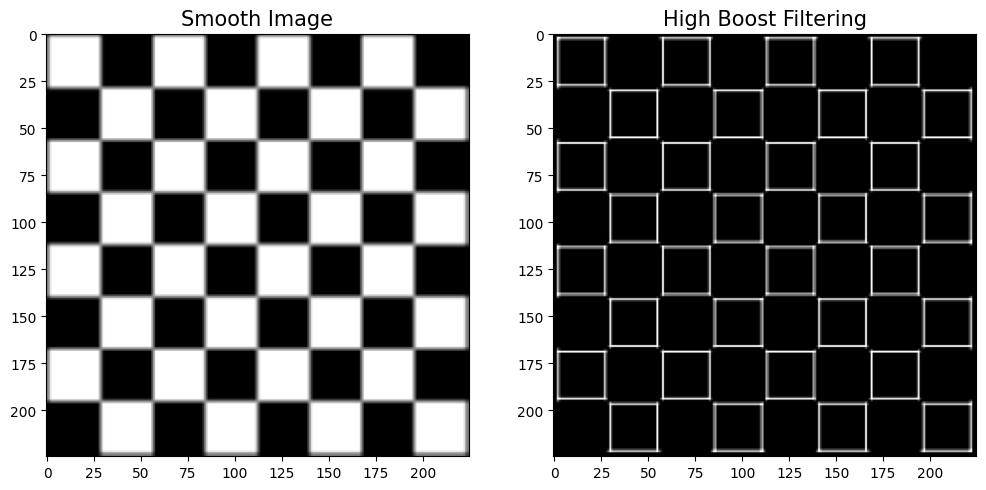

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_board, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(boostedImage, cmap = 'gray')
plt.title("High Boost Filtering", fontsize = 15)
plt.show()

In [ ]:
boostedImage2 = cv2.filter2D(GaussFilter_image, -1, HighBoostFilter) # -1 for flipping Kernel

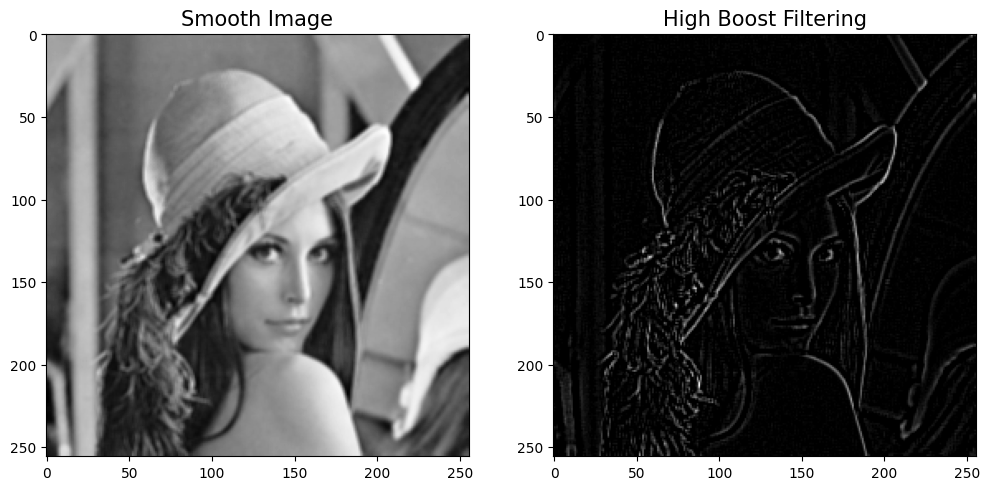

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Smooth Image", fontsize = 15)
plt.subplot(1,2,2)
plt.imshow(boostedImage2, cmap = 'gray')
plt.title("High Boost Filtering", fontsize = 15)
plt.show()

# Sobel Filters for Edge detection

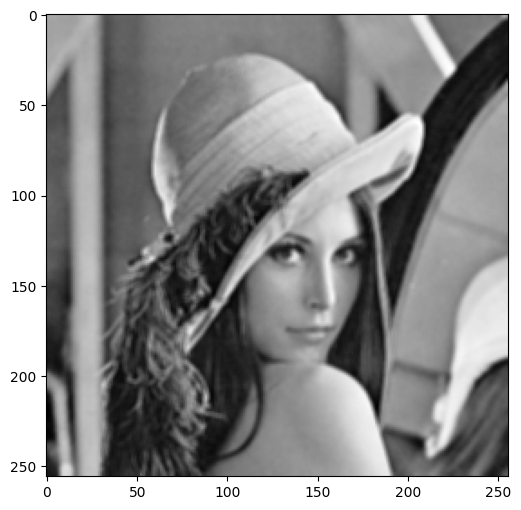

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.show()

In [ ]:
# Calculation of Sobelx
sobelx = cv2.Sobel(GaussFilter_image, cv2.CV_64F, 1, 0, ksize = 5)

In [ ]:
# Calculation of Sobely
sobely = cv2.Sobel(GaussFilter_image, cv2.CV_64F, 0, 1, ksize = 5)

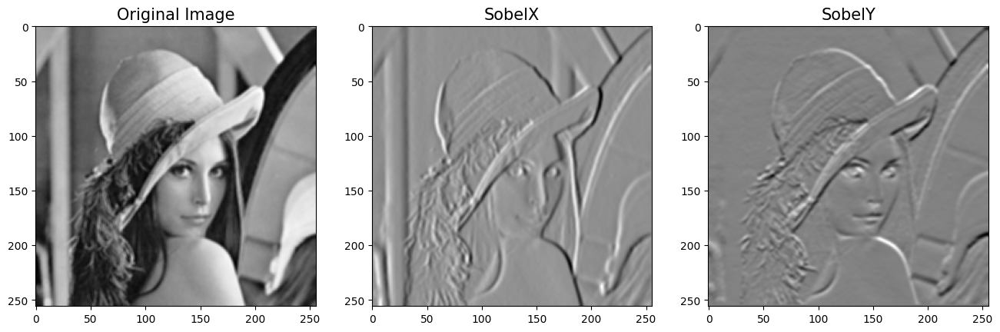

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(sobelx, cmap = 'gray')
plt.title("SobelX", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(sobely, cmap = 'gray')
plt.title("SobelY", fontsize = 15)
plt.show()

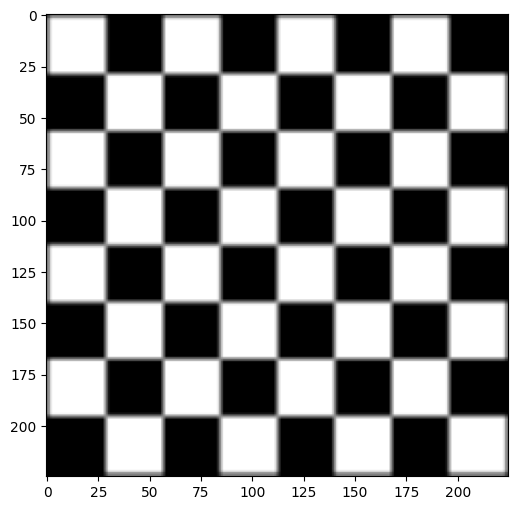

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(GaussFilter_board, cmap = 'gray')
plt.show()

In [ ]:
# Calculation of Sobelx
sobelx = cv2.Sobel(GaussFilter_board, cv2.CV_64F, 1, 0, ksize = 5)

In [ ]:
# Calculation of Sobely
sobely = cv2.Sobel(GaussFilter_board, cv2.CV_64F, 0, 1, ksize = 5)

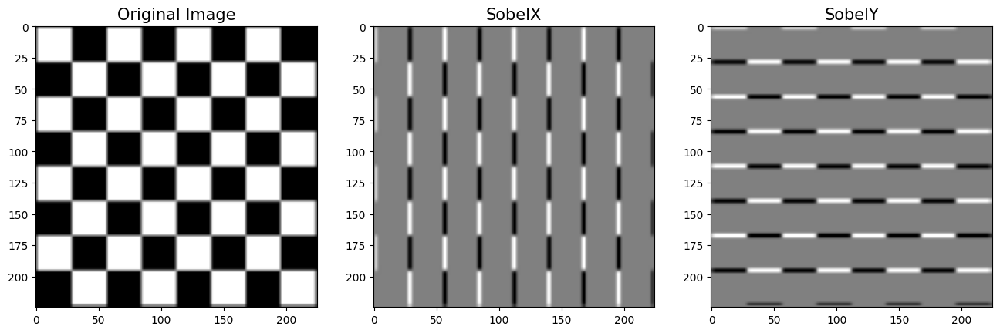

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
plt.imshow(GaussFilter_board, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(1,3,2)
plt.imshow(sobelx, cmap = 'gray')
plt.title("SobelX", fontsize = 15)
plt.subplot(1,3,3)
plt.imshow(sobely, cmap = 'gray')
plt.title("SobelY", fontsize = 15)
plt.show()

# Canny Edge Detector

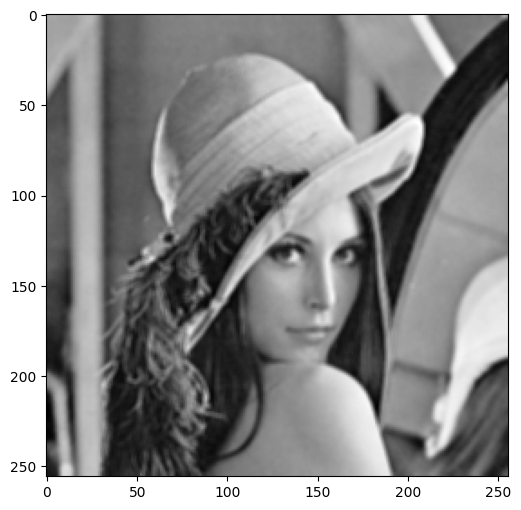

In [ ]:
plt.figure(figsize=(12,6))
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.show()

In [ ]:
# Canny Edge Detection uses gradient values as thresholds

canny1 = cv2.Canny(GaussFilter_image, 50, 120)


# Wide edge thresholds expect lots of edges
canny2 = cv2.Canny(GaussFilter_image, 10, 200)


# Narrow threshold, expect less edges 
canny3 = cv2.Canny(GaussFilter_image, 200, 240)


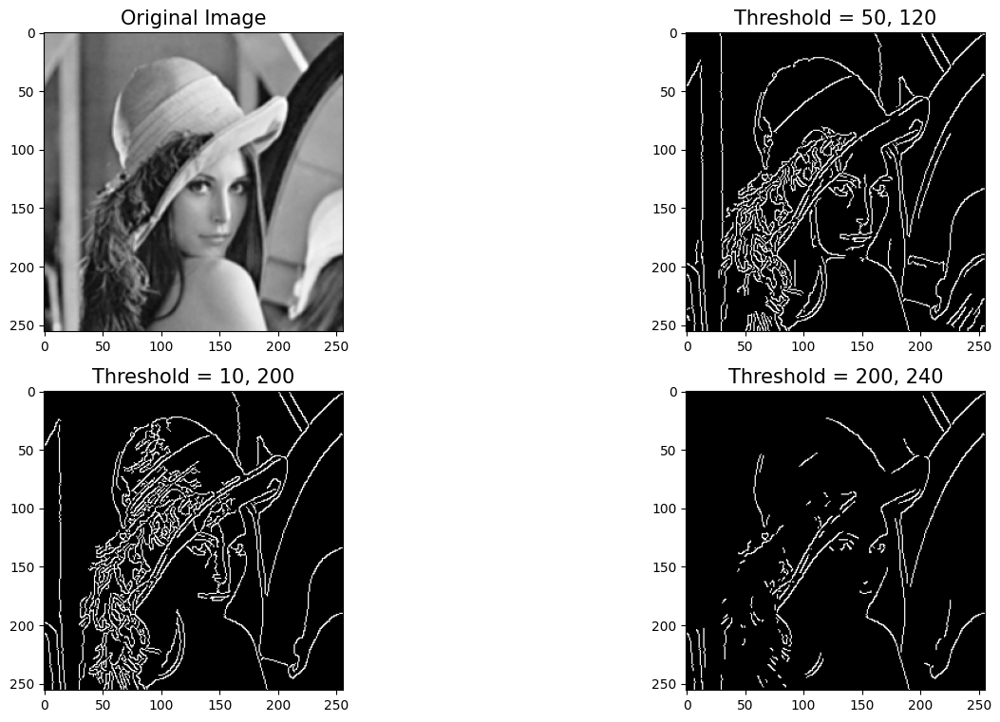

In [ ]:
plt.figure(figsize=(16,9))
plt.subplot(2,2,1)
plt.imshow(GaussFilter_image, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(2,2,2)
plt.imshow(canny1, cmap = 'gray')
plt.title("Threshold = 50, 120", fontsize = 15)
plt.subplot(2,2,3)
plt.imshow(canny2, cmap = 'gray')
plt.title("Threshold = 10, 200", fontsize = 15)
plt.subplot(2,2,4)
plt.imshow(canny3, cmap = 'gray')
plt.title("Threshold = 200, 240", fontsize = 15)
plt.show()

In [207]:
veg = cv2.imread("Vegetable.jpg", 0)

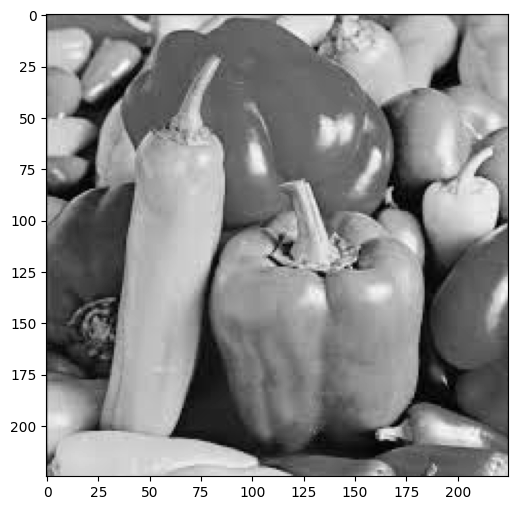

In [208]:
plt.figure(figsize=(12,6))
plt.imshow(veg, cmap = 'gray')
plt.show()

In [209]:
GaussFilter_veg = cv2.GaussianBlur(veg,(3,3), 15)  # 15 is the sigma value of Gaussian Filter 

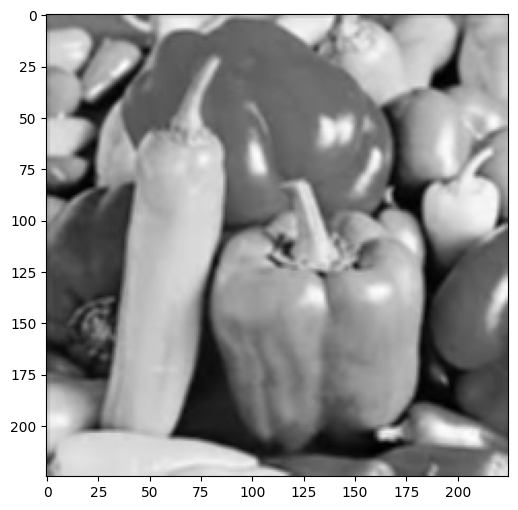

In [210]:
plt.figure(figsize=(12,6))
plt.imshow(GaussFilter_veg, cmap = 'gray')
plt.show()

In [211]:
canny1 = cv2.Canny(GaussFilter_veg, 50, 120)


# Wide edge thresholds expect lots of edges
canny2 = cv2.Canny(GaussFilter_veg, 10, 200)


# Narrow threshold, expect less edges 
canny3 = cv2.Canny(GaussFilter_veg, 200, 240)


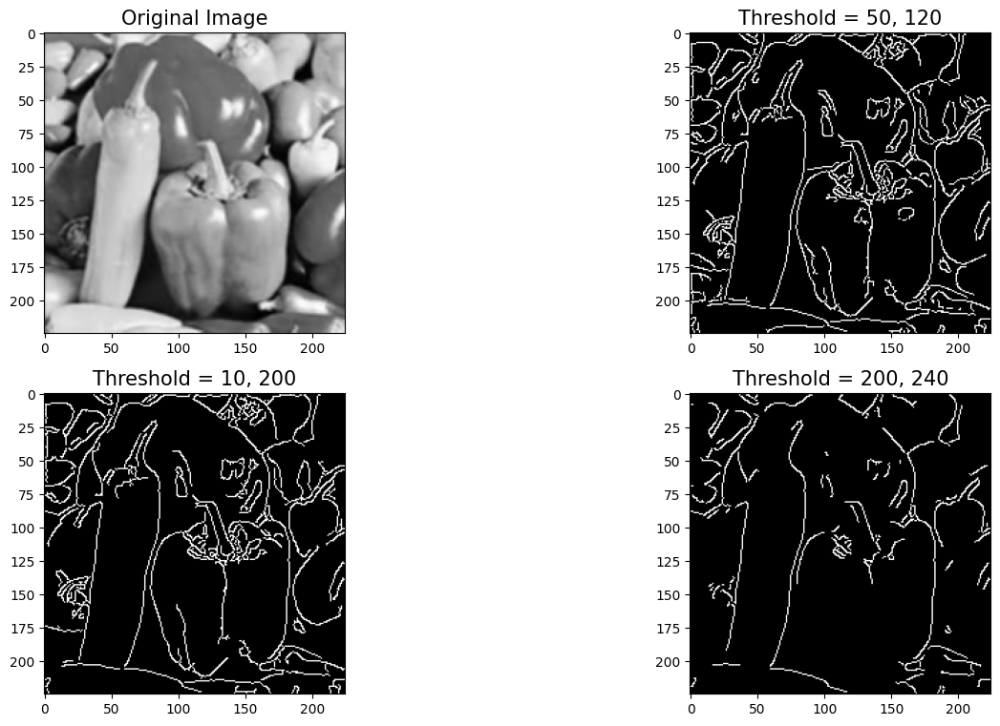

In [212]:
plt.figure(figsize=(16,9))
plt.subplot(2,2,1)
plt.imshow(GaussFilter_veg, cmap = 'gray')
plt.title("Original Image", fontsize = 15)
plt.subplot(2,2,2)
plt.imshow(canny1, cmap = 'gray')
plt.title("Threshold = 50, 120", fontsize = 15)
plt.subplot(2,2,3)
plt.imshow(canny2, cmap = 'gray')
plt.title("Threshold = 10, 200", fontsize = 15)
plt.subplot(2,2,4)
plt.imshow(canny3, cmap = 'gray')
plt.title("Threshold = 200, 240", fontsize = 15)
plt.show()